In [1]:
!pip install imantics
!pip install mmcv-full
!rm -rf mmdetection
!git clone https://github.com/open-mmlab/mmdetection.git
!cd mmdetection && pip install -e .

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 593.6/593.6 kB 10.6 MB/s eta 0:00:00a 0:00:01
  Preparing metadata (setup.py) ... done
  Created wheel for mmcv-full: filename=mmcv_full-1.7.0-cp37-cp37m-linux_x86_64.whl size=29911369 sha256=852a5580e5147ec9a55bab323d148b0784c71ebc4e49a9383f4179b73e169aca
  Stored in directory: /root/.cache/pip/wheels/d8/a3/6c/d150cb09404e0c2a4c83c871e4b140476da612de692df7c04c
Successfully built mmcv-full
Cloning into 'mmdetection'...
remote: Enumerating objects: 32369, done.
remote: Counting objects: 100% (31/31), done.
remote: Compressing objects: 100% (30/30), done.
remote: Total 32369 (delta 8), reused 11 (delta 1), pack-reused 32338
Receiving objects: 100% (32369/32369), 41.88 MiB | 26.44 MiB/s, done.
Resolving deltas: 100% (23304/23304), done.
Obtaining file:///kaggle/working/mmdetection
  Preparing metadata (setup.py) ... done
  Installing build dependencies ... done
  Getting requirements to build wheel ... done
  Preparing metadata (pyproject.toml) 

### Download model checkpoint

In [2]:
!mkdir checkpoints
!wget -c https://download.openmmlab.com/mmdetection/v2.0/mask_rcnn/mask_rcnn_r50_caffe_fpn_mstrain-poly_3x_coco/mask_rcnn_r50_caffe_fpn_mstrain-poly_3x_coco_bbox_mAP-0.408__segm_mAP-0.37_20200504_163245-42aa3d00.pth \
      -O checkpoints/mask_rcnn_r50_caffe_fpn_mstrain-poly_3x_coco_bbox_mAP-0.408__segm_mAP-0.37_20200504_163245-42aa3d00.pth

--2022-11-09 13:17:17--  https://download.openmmlab.com/mmdetection/v2.0/mask_rcnn/mask_rcnn_r50_caffe_fpn_mstrain-poly_3x_coco/mask_rcnn_r50_caffe_fpn_mstrain-poly_3x_coco_bbox_mAP-0.408__segm_mAP-0.37_20200504_163245-42aa3d00.pth
Resolving download.openmmlab.com (download.openmmlab.com)... 47.252.96.43
Connecting to download.openmmlab.com (download.openmmlab.com)|47.252.96.43|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 177867103 (170M) [application/octet-stream]
Saving to: ‘checkpoints/mask_rcnn_r50_caffe_fpn_mstrain-poly_3x_coco_bbox_mAP-0.408__segm_mAP-0.37_20200504_163245-42aa3d00.pth’

checkpoints/mask_rc 100%[===================>] 169.63M  9.38MB/s    in 18s     

2022-11-09 13:17:36 (9.34 MB/s) - ‘checkpoints/mask_rcnn_r50_caffe_fpn_mstrain-poly_3x_coco_bbox_mAP-0.408__segm_mAP-0.37_20200504_163245-42aa3d00.pth’ saved [177867103/177867103]



In [3]:
import os
import sys
import json
import matplotlib.patches as patches
import tqdm
from PIL import Image

DATA_DIR  = "../input/russian-road-signs-segmentation-dataset/sign_dataset"
TRAIN_DIR = os.path.join(DATA_DIR, "train")
VAL_DIR   = os.path.join(DATA_DIR, "val")

sys.path.append("mmdetection")

In [4]:
import mmcv
from mmcv.runner import load_checkpoint

from mmdet.apis import inference_detector, show_result_pyplot
from mmdet.models import build_detector

/opt/conda/lib/python3.7/site-packages/mmcv/__init__.py:21: UserWarning: On January 1, 2023, MMCV will release v2.0.0, in which it will remove components related to the training process and add a data transformation module. In addition, it will rename the package names mmcv to mmcv-lite and mmcv-full to mmcv. See https://github.com/open-mmlab/mmcv/blob/master/docs/en/compatibility.md for more details.
  'On January 1, 2023, MMCV will release v2.0.0, in which it will remove '


### Processing segmentation masks to `Coco` format

In [5]:
def patch_to_coords(figure):
    path      = figure.get_path()
    transform = figure.get_transform()
    newpath   = transform.transform_path(path)
    points    = newpath.to_polygons()[0]
    
    return [c for point in points for c in point]

def circle_to_polygon(region: dict):
    cx, cy, r  = region["cx"], region["cy"], region["r"]
    x, y, w, h = cx - r, cy - r, 2 * r, 2 * r
    polygon    = patch_to_coords(patches.Circle(xy=(cx, cy), radius=r))
    
    return polygon, x, y, w, h

def ellipse_to_polygon(region: dict):
    cx, cy, rx, ry = region["cx"], region["cy"], region["rx"], region["ry"]
    x,  y,  w,  h  = cx - rx, cy - ry, 2 * rx, 2 * ry
    polygon        = patch_to_coords(patches.Ellipse(xy=(cx, cy), width=w, height=h))
    
    return polygon, x, y, w, h

def rect_to_polygon(region: dict):
    x, y, w, h = region["x"], region["y"], region["width"], region["height"]
    poly       = [x, y, x, y + h, x + w, y + h, x + w, y, x, y]
    
    return poly, x, y, w, h
    
def to_polygon(region: dict, figure: str):
    if figure == "rect":
        return rect_to_polygon(region)
    elif figure == "circle":
        return circle_to_polygon(region)
    elif figure == "ellipse":
        return ellipse_to_polygon(region)
    else:
        xs, ys = region["all_points_x"], region["all_points_y"]
        x, y   = min(xs),     min(ys)
        w, h   = max(xs) - x, max(ys) - y
        poly   = [p for point in zip(xs, ys) for p in point]
        
        return poly, x, y, w, h
        

def parse_region(region: dict):
    if "shape_attributes" not in region:
        return None
    
    if region["region_attributes"].get("name") != "road sign":
        return None
    
    region = region["shape_attributes"]
    figure = region["name"]
    
    return to_polygon(region, figure)


def to_coco(ann_path: str, image_folder: str):
    
    with open(ann_path, "r") as f:
        ann = json.load(f)
    
    annots  = []
    images  = []
    objects = 0
    
    for image_id, image_ann in tqdm.tqdm(enumerate(ann.values())):
        file_name = image_ann["filename"]
        regions   = image_ann["regions"].values()
        image     = Image.open(os.path.join(image_folder, file_name))
        
        image_data = {
            "id"        : image_id,
            "file_name" : file_name,
            "width"     : image.width,
            "height"    : image.height
        }
        
        images.append(image_data)
        
        for region in regions:
            parsed = parse_region(region)

            if parsed is None:
                continue
            
            poly, x, y, w, h = parsed
            
            region_data = {
                "image_id"    : image_id,
                "id"          : objects,
                "area"        : w * h,
                "bbox"        : [x, y, w, h],
                "segmentation": [poly],
                "category_id" : 0,
                "iscrowd"     : 0
            }
            
            annots.append(region_data)
            objects += 1
    
    coco_format_json = dict(
        images=images,
        annotations=annots,
        categories=[{"id": 0, "name": "road-sign"}]
    )
    
    return coco_format_json

In [6]:
train_annotations = to_coco(
    ann_path=os.path.join(TRAIN_DIR, "via_region_data.json"), 
    image_folder=TRAIN_DIR
)

test_annotations = to_coco(
    ann_path=os.path.join(VAL_DIR, "via_region_data.json"),
    image_folder=VAL_DIR
)

with open("coco_train.json", "w") as f:
    json.dump(train_annotations, f)
    
with open("coco_test.json", "w") as f:
    json.dump(test_annotations, f)

2054it [00:23, 87.54it/s] 
127it [00:01, 90.08it/s]


In [7]:
from mmcv import Config

cfg = Config.fromfile('mmdetection/configs/mask_rcnn/mask_rcnn_r50_caffe_fpn_mstrain-poly_1x_coco.py')

### Configure model training parameters

In [8]:
cfg.dataset_type = "COCODataset"

cfg.data.test.ann_file = "coco_test.json"
cfg.data.test.img_prefix = VAL_DIR
cfg.data.test.classes = ("road-sign",)

cfg.data.train.ann_file = "coco_train.json"
cfg.data.train.img_prefix = TRAIN_DIR
cfg.data.train.classes = ("road-sign",)

cfg.data.val.ann_file = "coco_test.json"
cfg.data.val.img_prefix = VAL_DIR
cfg.data.val.classes = ("road-sign",)

cfg.model.roi_head.bbox_head.num_classes = 1
cfg.model.roi_head.mask_head.num_classes = 1

cfg.load_from = "checkpoints/mask_rcnn_r50_caffe_fpn_mstrain-poly_3x_coco_bbox_mAP-0.408__segm_mAP-0.37_20200504_163245-42aa3d00.pth"

cfg.work_dir = "./exps"

cfg.optimizer.lr = 0.02 / 8
cfg.lr_config.warmup = None
cfg.log_config.interval = 10

cfg.evaluation.interval = 1
cfg.checkpoint_config.interval = 1

cfg.seed = 239
cfg.gpu_ids = range(1)
cfg.runner.max_epochs = 4
cfg.device = "cuda"

cfg.log_config.hooks = [
    dict(type="TextLoggerHook"),
    dict(type="TensorboardLoggerHook")
]


print(f"Config:\n{cfg.pretty_text}")

Config:
model = dict(
    type='MaskRCNN',
    backbone=dict(
        type='ResNet',
        depth=50,
        num_stages=4,
        out_indices=(0, 1, 2, 3),
        frozen_stages=1,
        norm_cfg=dict(type='BN', requires_grad=False),
        norm_eval=True,
        style='caffe',
        init_cfg=dict(
            type='Pretrained',
            checkpoint='open-mmlab://detectron2/resnet50_caffe')),
    neck=dict(
        type='FPN',
        in_channels=[256, 512, 1024, 2048],
        out_channels=256,
        num_outs=5),
    rpn_head=dict(
        type='RPNHead',
        in_channels=256,
        feat_channels=256,
        anchor_generator=dict(
            type='AnchorGenerator',
            scales=[8],
            ratios=[0.5, 1.0, 2.0],
            strides=[4, 8, 16, 32, 64]),
        bbox_coder=dict(
            type='DeltaXYWHBBoxCoder',
            target_means=[0.0, 0.0, 0.0, 0.0],
            target_stds=[1.0, 1.0, 1.0, 1.0]),
        loss_cls=dict(
            type='Cross

In [9]:
from mmdet.datasets import build_dataset
from mmdet.models import build_detector
from mmdet.apis import train_detector


datasets = [build_dataset(cfg.data.train)]
model = build_detector(cfg.model)
model.CLASSES = datasets[0].CLASSES

mmcv.mkdir_or_exist(os.path.abspath(cfg.work_dir))

loading annotations into memory...
Done (t=0.06s)
creating index...
index created!


### Training model

In [10]:
train_detector(model, datasets, cfg, distributed=False, validate=True)

2022-11-09 13:18:13,894 - mmdet - INFO - Automatic scaling of learning rate (LR) has been disabled.
2022-11-09 13:18:13,907 - mmdet - INFO - load checkpoint from local path: checkpoints/mask_rcnn_r50_caffe_fpn_mstrain-poly_3x_coco_bbox_mAP-0.408__segm_mAP-0.37_20200504_163245-42aa3d00.pth
2022-11-09 13:18:14,097 - mmdet - WARNING - The model and loaded state dict do not match exactly

size mismatch for roi_head.bbox_head.fc_cls.weight: copying a param with shape torch.Size([81, 1024]) from checkpoint, the shape in current model is torch.Size([2, 1024]).
size mismatch for roi_head.bbox_head.fc_cls.bias: copying a param with shape torch.Size([81]) from checkpoint, the shape in current model is torch.Size([2]).
size mismatch for roi_head.bbox_head.fc_reg.weight: copying a param with shape torch.Size([320, 1024]) from checkpoint, the shape in current model is torch.Size([4, 1024]).
size mismatch for roi_head.bbox_head.fc_reg.bias: copying a param with shape torch.Size([320]) from checkpoin

loading annotations into memory...
Done (t=0.00s)
creating index...
index created!


2022-11-09 13:18:14,111 - mmdet - INFO - Start running, host: root@8aca176db63a, work_dir: /kaggle/working/exps
2022-11-09 13:18:14,113 - mmdet - INFO - Hooks will be executed in the following order:
before_run:
(VERY_HIGH   ) StepLrUpdaterHook                  
(NORMAL      ) CheckpointHook                     
(LOW         ) EvalHook                           
(VERY_LOW    ) TextLoggerHook                     
(VERY_LOW    ) TensorboardLoggerHook              
 -------------------- 
before_train_epoch:
(VERY_HIGH   ) StepLrUpdaterHook                  
(NORMAL      ) NumClassCheckHook                  
(LOW         ) IterTimerHook                      
(LOW         ) EvalHook                           
(VERY_LOW    ) TextLoggerHook                     
(VERY_LOW    ) TensorboardLoggerHook              
 -------------------- 
before_train_iter:
(VERY_HIGH   ) StepLrUpdaterHook                  
(LOW         ) IterTimerHook                      
(LOW         ) EvalHook                 

[>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>] 127/127, 6.9 task/s, elapsed: 19s, ETA:     0s

2022-11-09 13:24:46,239 - mmdet - INFO - Evaluating bbox...


Loading and preparing results...
DONE (t=0.00s)
creating index...
index created!
Running per image evaluation...
Evaluate annotation type *bbox*


2022-11-09 13:24:46,393 - mmdet - INFO - 
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.629
 Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets=1000 ] = 0.891
 Average Precision  (AP) @[ IoU=0.75      | area=   all | maxDets=1000 ] = 0.790
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= small | maxDets=1000 ] = 0.590
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=medium | maxDets=1000 ] = 0.654
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= large | maxDets=1000 ] = 0.616
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.704
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets=300 ] = 0.704
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets=1000 ] = 0.704
 Average Recall     (AR) @[ IoU=0.50:0.95 | area= small | maxDets=1000 ] = 0.686
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=medium | maxDets=1000 ] = 0.728
 Average Recall     (AR) @[ IoU=0.50:0.95 | area= large | maxDets=1000

DONE (t=0.11s).
Accumulating evaluation results...
DONE (t=0.03s).
Loading and preparing results...
DONE (t=0.01s)
creating index...
index created!
Running per image evaluation...
Evaluate annotation type *segm*
DONE (t=0.14s).
Accumulating evaluation results...


2022-11-09 13:24:46,581 - mmdet - INFO - 
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.586
 Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets=1000 ] = 0.892
 Average Precision  (AP) @[ IoU=0.75      | area=   all | maxDets=1000 ] = 0.710
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= small | maxDets=1000 ] = 0.467
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=medium | maxDets=1000 ] = 0.646
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= large | maxDets=1000 ] = 0.616
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.667
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets=300 ] = 0.667
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets=1000 ] = 0.667
 Average Recall     (AR) @[ IoU=0.50:0.95 | area= small | maxDets=1000 ] = 0.654
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=medium | maxDets=1000 ] = 0.685
 Average Recall     (AR) @[ IoU=0.50:0.95 | area= large | maxDets=1000

DONE (t=0.04s).


mmdetection/mmdet/core/mask/structures.py:1071: DeprecationWarning: `np.bool` is a deprecated alias for the builtin `bool`. To silence this warning, use `bool` by itself. Doing this will not modify any behavior and is safe. If you specifically wanted the numpy scalar type, use `np.bool_` here.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  bitmap_mask = maskUtils.decode(rle).astype(np.bool)
2022-11-09 13:24:52,471 - mmdet - INFO - Epoch [2][10/1027]	lr: 2.500e-03, eta: 0:18:17, time: 0.573, data_time: 0.243, memory: 3523, loss_rpn_cls: 0.0020, loss_rpn_bbox: 0.0095, loss_cls: 0.0560, acc: 97.5000, loss_bbox: 0.1137, loss_mask: 0.1618, loss: 0.3431
2022-11-09 13:24:55,790 - mmdet - INFO - Epoch [2][20/1027]	lr: 2.500e-03, eta: 0:18:12, time: 0.333, data_time: 0.024, memory: 3523, loss_rpn_cls: 0.0031, loss_rpn_bbox: 0.0057, loss_cls: 0.0463, acc: 98.2617, loss_bbox: 0.0898, loss_mask: 0.1502, loss: 0.2951
2022-

[>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>] 127/127, 7.0 task/s, elapsed: 18s, ETA:     0s

/opt/conda/lib/python3.7/multiprocessing/popen_fork.py:70: ResourceWarning: unclosed socket <zmq.Socket(zmq.PUSH) at 0x7f92431f6e50>
  self.pid = os.fork()
/opt/conda/lib/python3.7/multiprocessing/popen_fork.py:70: ResourceWarning: unclosed socket <zmq.Socket(zmq.PUSH) at 0x7f92431f6e50>
  self.pid = os.fork()
2022-11-09 13:31:08,025 - mmdet - INFO - Evaluating bbox...


Loading and preparing results...
DONE (t=0.00s)
creating index...
index created!
Running per image evaluation...
Evaluate annotation type *bbox*


2022-11-09 13:31:08,175 - mmdet - INFO - 
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.664
 Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets=1000 ] = 0.920
 Average Precision  (AP) @[ IoU=0.75      | area=   all | maxDets=1000 ] = 0.820
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= small | maxDets=1000 ] = 0.632
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=medium | maxDets=1000 ] = 0.686
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= large | maxDets=1000 ] = 0.664
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.731
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets=300 ] = 0.731
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets=1000 ] = 0.731
 Average Recall     (AR) @[ IoU=0.50:0.95 | area= small | maxDets=1000 ] = 0.718
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=medium | maxDets=1000 ] = 0.747
 Average Recall     (AR) @[ IoU=0.50:0.95 | area= large | maxDets=1000

DONE (t=0.11s).
Accumulating evaluation results...
DONE (t=0.03s).
Loading and preparing results...
DONE (t=0.00s)
creating index...
index created!
Running per image evaluation...
Evaluate annotation type *segm*
DONE (t=0.12s).
Accumulating evaluation results...


2022-11-09 13:31:08,348 - mmdet - INFO - 
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.604
 Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets=1000 ] = 0.909
 Average Precision  (AP) @[ IoU=0.75      | area=   all | maxDets=1000 ] = 0.752
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= small | maxDets=1000 ] = 0.507
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=medium | maxDets=1000 ] = 0.652
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= large | maxDets=1000 ] = 0.609
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.675
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets=300 ] = 0.675
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets=1000 ] = 0.675
 Average Recall     (AR) @[ IoU=0.50:0.95 | area= small | maxDets=1000 ] = 0.664
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=medium | maxDets=1000 ] = 0.693
 Average Recall     (AR) @[ IoU=0.50:0.95 | area= large | maxDets=1000

DONE (t=0.03s).


mmdetection/mmdet/core/mask/structures.py:1071: DeprecationWarning: `np.bool` is a deprecated alias for the builtin `bool`. To silence this warning, use `bool` by itself. Doing this will not modify any behavior and is safe. If you specifically wanted the numpy scalar type, use `np.bool_` here.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  bitmap_mask = maskUtils.decode(rle).astype(np.bool)
2022-11-09 13:31:14,352 - mmdet - INFO - Epoch [3][10/1027]	lr: 2.500e-03, eta: 0:12:03, time: 0.584, data_time: 0.248, memory: 3553, loss_rpn_cls: 0.0011, loss_rpn_bbox: 0.0068, loss_cls: 0.0422, acc: 98.3398, loss_bbox: 0.0795, loss_mask: 0.1613, loss: 0.2909
2022-11-09 13:31:17,700 - mmdet - INFO - Epoch [3][20/1027]	lr: 2.500e-03, eta: 0:11:59, time: 0.336, data_time: 0.025, memory: 3553, loss_rpn_cls: 0.0027, loss_rpn_bbox: 0.0062, loss_cls: 0.0449, acc: 98.2129, loss_bbox: 0.0902, loss_mask: 0.1663, loss: 0.3103
2022-

[>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>] 127/127, 5.9 task/s, elapsed: 22s, ETA:     0s

/opt/conda/lib/python3.7/multiprocessing/popen_fork.py:70: ResourceWarning: unclosed socket <zmq.Socket(zmq.PUSH) at 0x7f92431f6e50>
  self.pid = os.fork()
/opt/conda/lib/python3.7/multiprocessing/popen_fork.py:70: ResourceWarning: unclosed socket <zmq.Socket(zmq.PUSH) at 0x7f92431f6e50>
  self.pid = os.fork()
2022-11-09 13:37:34,270 - mmdet - INFO - Evaluating bbox...


Loading and preparing results...
DONE (t=0.00s)
creating index...
index created!
Running per image evaluation...
Evaluate annotation type *bbox*


2022-11-09 13:37:34,436 - mmdet - INFO - 
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.670
 Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets=1000 ] = 0.933
 Average Precision  (AP) @[ IoU=0.75      | area=   all | maxDets=1000 ] = 0.818
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= small | maxDets=1000 ] = 0.644
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=medium | maxDets=1000 ] = 0.690
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= large | maxDets=1000 ] = 0.665
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.735
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets=300 ] = 0.735
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets=1000 ] = 0.735
 Average Recall     (AR) @[ IoU=0.50:0.95 | area= small | maxDets=1000 ] = 0.721
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=medium | maxDets=1000 ] = 0.750
 Average Recall     (AR) @[ IoU=0.50:0.95 | area= large | maxDets=1000

DONE (t=0.12s).
Accumulating evaluation results...
DONE (t=0.03s).
Loading and preparing results...
DONE (t=0.01s)
creating index...
index created!
Running per image evaluation...
Evaluate annotation type *segm*
DONE (t=0.12s).
Accumulating evaluation results...


2022-11-09 13:37:34,610 - mmdet - INFO - 
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.620
 Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets=1000 ] = 0.915
 Average Precision  (AP) @[ IoU=0.75      | area=   all | maxDets=1000 ] = 0.758
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= small | maxDets=1000 ] = 0.542
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=medium | maxDets=1000 ] = 0.675
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= large | maxDets=1000 ] = 0.610
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.692
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets=300 ] = 0.692
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets=1000 ] = 0.692
 Average Recall     (AR) @[ IoU=0.50:0.95 | area= small | maxDets=1000 ] = 0.694
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=medium | maxDets=1000 ] = 0.704
 Average Recall     (AR) @[ IoU=0.50:0.95 | area= large | maxDets=1000

DONE (t=0.04s).


mmdetection/mmdet/core/mask/structures.py:1071: DeprecationWarning: `np.bool` is a deprecated alias for the builtin `bool`. To silence this warning, use `bool` by itself. Doing this will not modify any behavior and is safe. If you specifically wanted the numpy scalar type, use `np.bool_` here.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  bitmap_mask = maskUtils.decode(rle).astype(np.bool)
2022-11-09 13:37:40,814 - mmdet - INFO - Epoch [4][10/1027]	lr: 2.500e-03, eta: 0:05:58, time: 0.605, data_time: 0.265, memory: 3820, loss_rpn_cls: 0.0023, loss_rpn_bbox: 0.0066, loss_cls: 0.0346, acc: 98.6133, loss_bbox: 0.0731, loss_mask: 0.1271, loss: 0.2437
2022-11-09 13:37:44,261 - mmdet - INFO - Epoch [4][20/1027]	lr: 2.500e-03, eta: 0:05:55, time: 0.346, data_time: 0.027, memory: 3820, loss_rpn_cls: 0.0014, loss_rpn_bbox: 0.0096, loss_cls: 0.0424, acc: 98.2324, loss_bbox: 0.0825, loss_mask: 0.1452, loss: 0.2810
2022-

[>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>] 127/127, 7.0 task/s, elapsed: 18s, ETA:     0s

/opt/conda/lib/python3.7/multiprocessing/popen_fork.py:70: ResourceWarning: unclosed socket <zmq.Socket(zmq.PUSH) at 0x7f92431f6e50>
  self.pid = os.fork()
/opt/conda/lib/python3.7/multiprocessing/popen_fork.py:70: ResourceWarning: unclosed socket <zmq.Socket(zmq.PUSH) at 0x7f92431f6e50>
  self.pid = os.fork()
2022-11-09 13:43:58,962 - mmdet - INFO - Evaluating bbox...


Loading and preparing results...
DONE (t=0.00s)
creating index...
index created!
Running per image evaluation...
Evaluate annotation type *bbox*


2022-11-09 13:43:59,119 - mmdet - INFO - 
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.674
 Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets=1000 ] = 0.928
 Average Precision  (AP) @[ IoU=0.75      | area=   all | maxDets=1000 ] = 0.819
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= small | maxDets=1000 ] = 0.654
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=medium | maxDets=1000 ] = 0.693
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= large | maxDets=1000 ] = 0.668
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.733
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets=300 ] = 0.733
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets=1000 ] = 0.733
 Average Recall     (AR) @[ IoU=0.50:0.95 | area= small | maxDets=1000 ] = 0.719
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=medium | maxDets=1000 ] = 0.751
 Average Recall     (AR) @[ IoU=0.50:0.95 | area= large | maxDets=1000

DONE (t=0.12s).
Accumulating evaluation results...
DONE (t=0.03s).
Loading and preparing results...
DONE (t=0.00s)
creating index...
index created!
Running per image evaluation...
Evaluate annotation type *segm*
DONE (t=0.13s).
Accumulating evaluation results...


2022-11-09 13:43:59,298 - mmdet - INFO - 
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.605
 Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets=1000 ] = 0.920
 Average Precision  (AP) @[ IoU=0.75      | area=   all | maxDets=1000 ] = 0.722
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= small | maxDets=1000 ] = 0.536
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=medium | maxDets=1000 ] = 0.636
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= large | maxDets=1000 ] = 0.631
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.665
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets=300 ] = 0.665
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets=1000 ] = 0.665
 Average Recall     (AR) @[ IoU=0.50:0.95 | area= small | maxDets=1000 ] = 0.672
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=medium | maxDets=1000 ] = 0.674
 Average Recall     (AR) @[ IoU=0.50:0.95 | area= large | maxDets=1000

DONE (t=0.04s).


### Evaluating on validation dataset

In [25]:
import pycocotools

df = pycocotools.coco.COCO("coco_test.json")

loading annotations into memory...
Done (t=0.01s)
creating index...
index created!


In [109]:
def predict_coco(model, coco_df: pycocotools.coco.COCO, images_folder: str):
    predictions = {}
    
    for img in tqdm.tqdm(coco_df.imgs.values()):
        image_id  = img["id"]
        file_name = img["file_name"]
        
        path  = os.path.join(images_folder, file_name)
        image = mmcv.imread(path)
        
        _, pred  = inference_detector(model, image)
        
        anns = coco_df.imgToAnns[image_id]
        true = [coco_df.annToMask(ann) for ann in anns]
        
        predictions[image_id] = dict(
            pred_masks=[p.astype(bool) for p in pred[0]], 
            true_masks=[t.astype(bool) for t in true]
        )
        
    return predictions

In [110]:
predictions = predict_coco(model, df, VAL_DIR)

100%|██████████| 127/127 [00:18<00:00,  6.70it/s]


### Compute L2 metric

In [112]:
import numpy as np

def compute_l2(predictions):
    l2 = []
    
    for v in tqdm.tqdm(predictions.values()):
        trues = v["true_masks"]
        preds = v["pred_masks"]
        
        true = np.zeros_like(trues[0])
        pred = np.zeros_like(preds[0])
        
        for m in trues:
            true |= m
        
        for m in preds:
            pred |= m
        
        distance = (true ^ pred).mean()
        l2.append(distance)
            
    return np.mean(l2)

compute_l2(predictions)

100%|██████████| 127/127 [00:01<00:00, 69.08it/s] 


0.0041414738074492105

### Compute IoU, Precision, Recall

In [118]:
def ipr(true, pred):
    """Calculate Iou, Precision, Recall"""
    intersection = (true & pred).sum()
    union        = (true | pred).sum()
    
    return intersection / union, intersection / pred.sum(), intersection / true.sum()
        
    
def compute_iou_precision_recall(predictions):
    iou       = []
    precision = []
    recall    = []
    
    for v in tqdm.tqdm(predictions.values()):
        trues = v["true_masks"]
        preds = v["pred_masks"]
        
        image_ious = []
        image_prec = []
        image_recs = []
        
        for t in trues:
            
            iou_best  = 0
            prec_best = 0
            rec_best  = 0
            
            for p in preds:
                iou_, prec_, rec_ = ipr(t, p)
                if iou_ > iou_best:
                    iou_best  = iou_
                    prec_best = prec_
                    rec_best  = rec_
                
            image_ious.append(iou_best)
            image_prec.append(prec_best)
            image_recs.append(rec_best)
        
        iou.append(np.mean(image_ious))
        precision.append(np.mean(image_prec))
        recall.append(np.mean(image_recs))
    
    return np.array(iou), np.array(precision), np.array(recall)
        
        
    
iou, precision, recall = compute_iou_precision_recall(predictions)

n = len(iou)

print(f"IoU > 0.50: {(iou > 0.50).sum() / n * 100:.2f}%")
print(f"IoU > 0.75: {(iou > 0.75).sum() / n * 100:.2f}%")
print(f"IoU > 0.90: {(iou > 0.90).sum() / n * 100:.2f}%")
print()
print(f"IoU      : {iou.mean()}")
print(f"Recall   : {recall.mean()}")
print(f"Precision: {precision.mean()}")

100%|██████████| 127/127 [00:39<00:00,  3.20it/s]

IoU > 0.50: 97.64%
IoU > 0.75: 81.89%
IoU > 0.90: 15.75%

IoU      : 0.8084800472611618
Recall   : 0.853641213412909
Precision: 0.9183776929224546


### Saving model

In [11]:
import torch

torch.save(model, "road-signs-segmentor.pth")

### Evaluating model on custom photos

mmdetection/mmdet/datasets/utils.py:70: UserWarning: "ImageToTensor" pipeline is replaced by "DefaultFormatBundle" for batch inference. It is recommended to manually replace it in the test data pipeline in your config file.
  'data pipeline in your config file.', UserWarning)


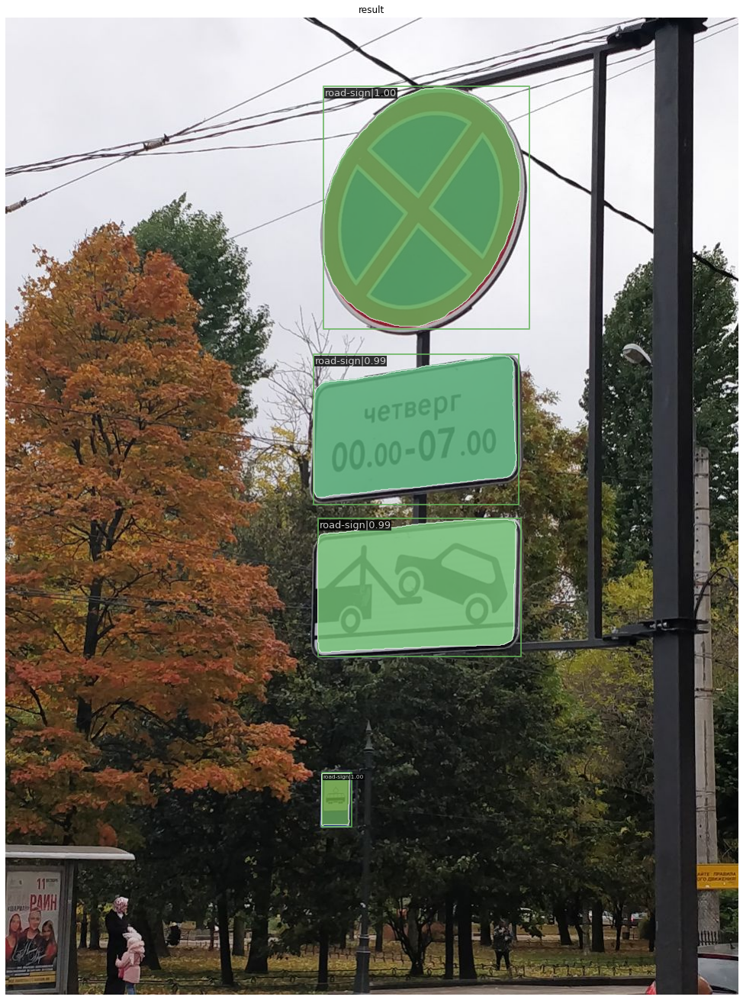

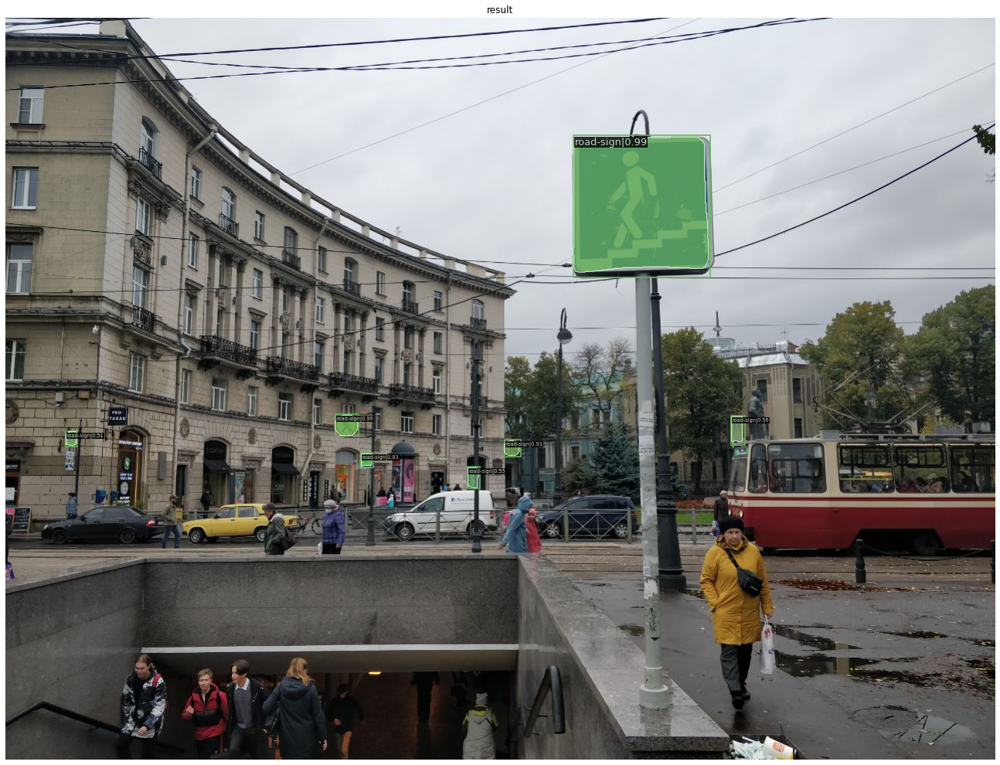

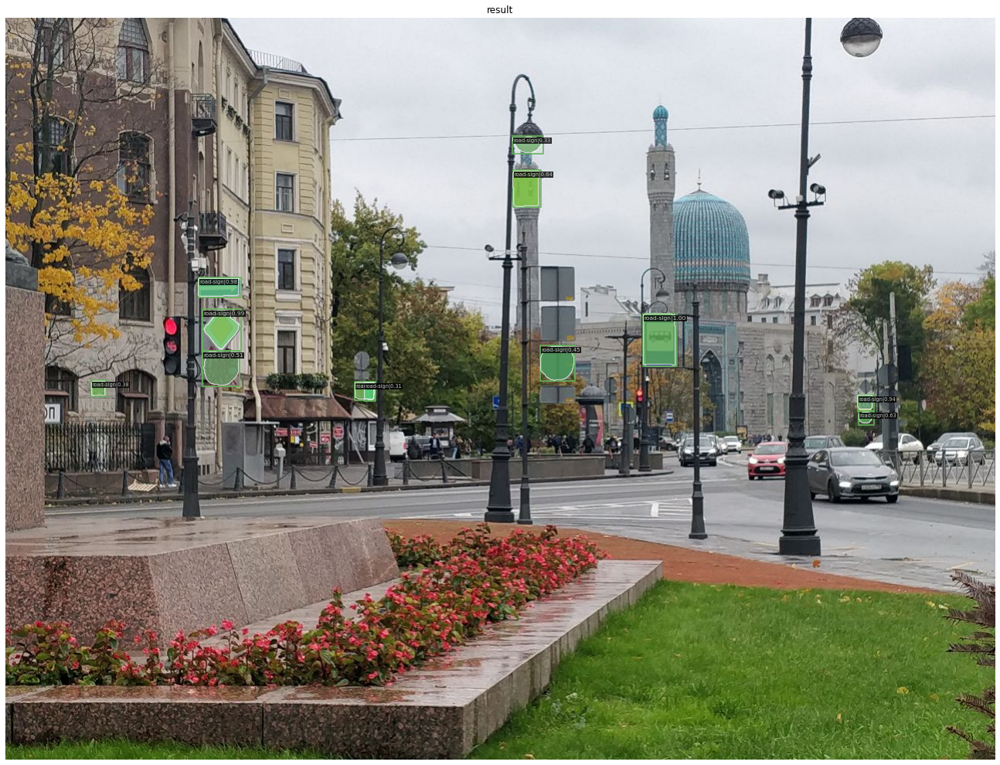

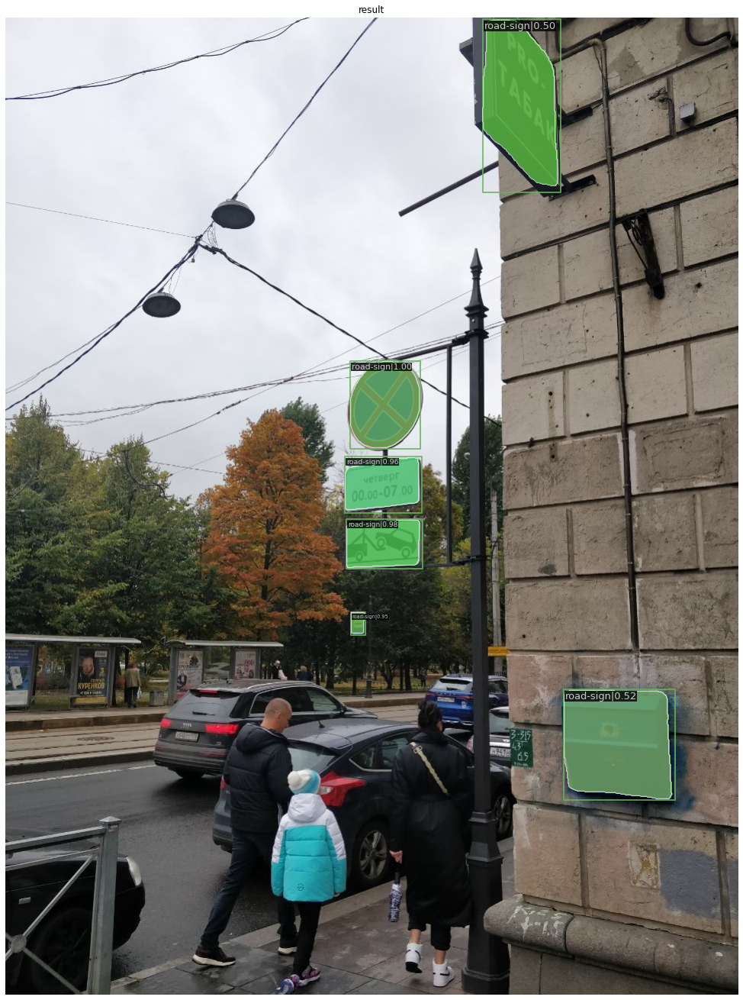

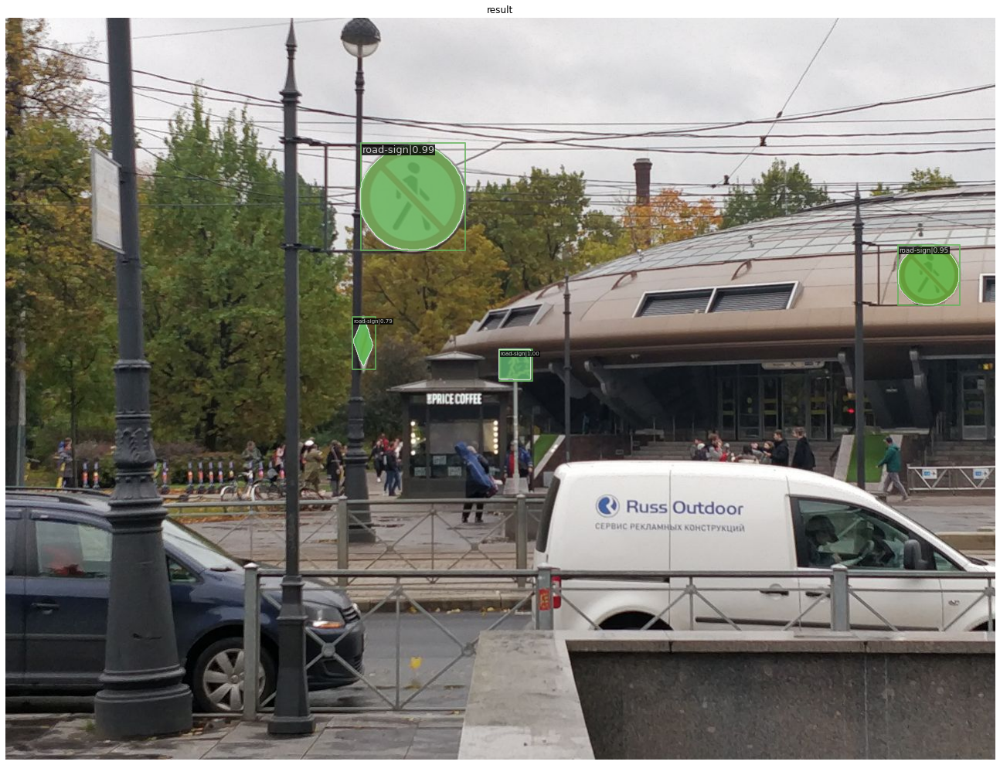

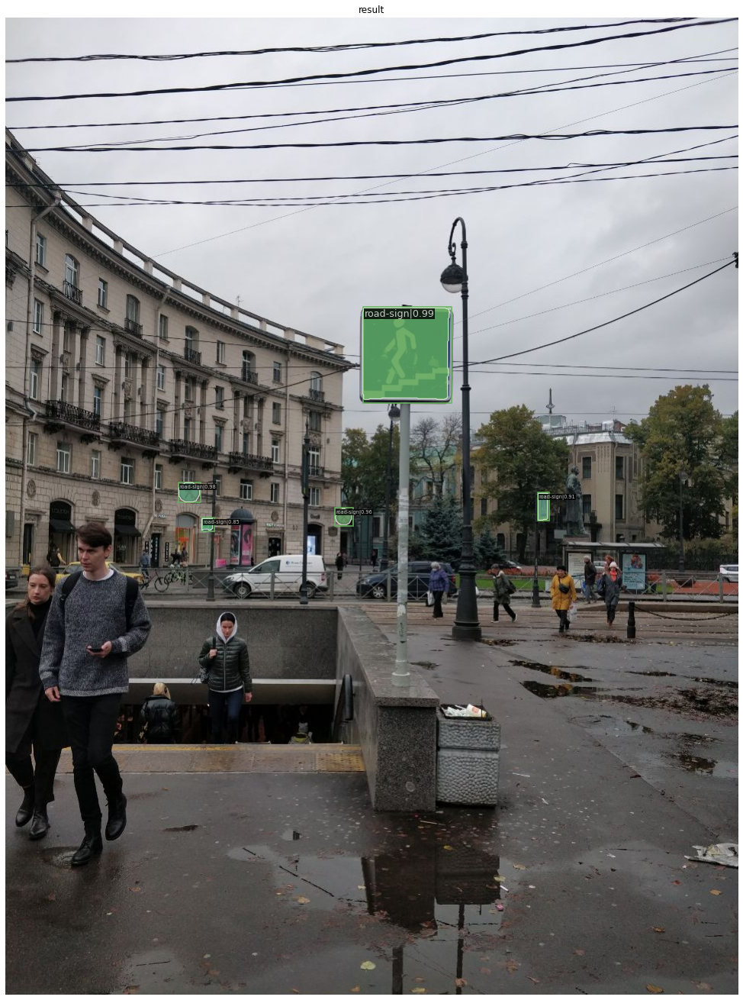

In [12]:
test_dir = "../input/roadsigns"
model.cfg = cfg

for file in os.listdir(test_dir):
        img = mmcv.imread(os.path.join(test_dir, file))
        result = inference_detector(model, img)
        show_result_pyplot(model, img, result)